In [3]:
# step1. 데이터셋 내려받기
import warnings
import tensorflow as tf
warnings.filterwarnings("ignore")


import tensorflow_datasets as tfds

import matplotlib.pyplot as plt

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)
# step 1

In [4]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [5]:
# Step2. 데이터넷을 모델에 넣을 수 있는 형태로 준비하기
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

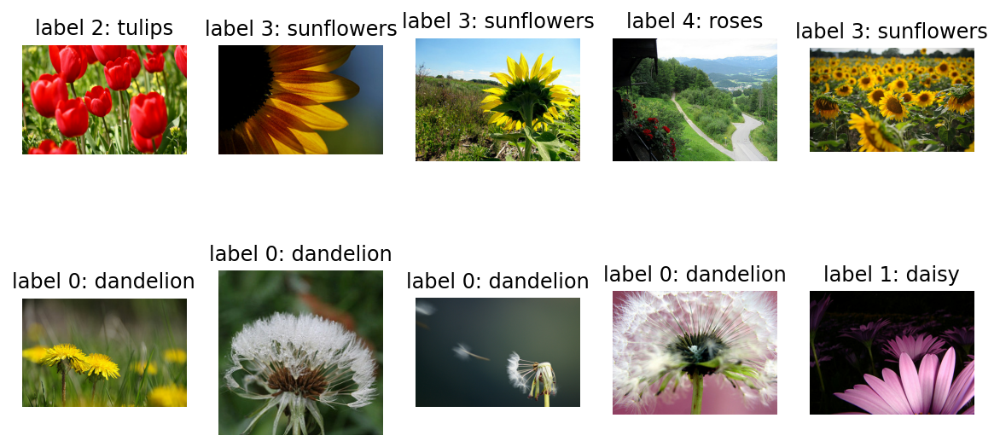

In [6]:
# delete
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [7]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [8]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

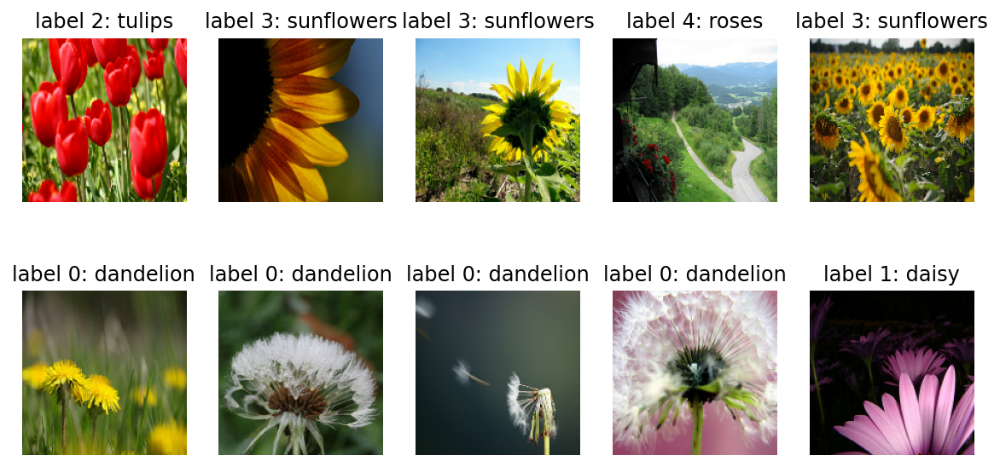

In [9]:
#delete
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D


In [20]:
#step3. 모델 설계하기
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
# class num change
    Dense(units=5, activation='softmax')
])

In [21]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 25600)            

In [22]:
import numpy as np


(2, 2)


array([[1, 2],
       [3, 4]])

In [23]:
base_learning_rate = 0.0001
#loss + regularization value
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [24]:

BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [28]:
#step2. 데이터넷을 모델에 넣을 수 있는 형태로 준비하기
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [29]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [32]:

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/12 [==============================] - 0s 32ms/step - loss: 1.6506 - accuracy: 0.1308
initial loss: 1.65
initial accuracy: 0.13


In [33]:
#Step4. 모델 학습시키기
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 18s 193ms/step - loss: 1.3849 - accuracy: 0.4131 - val_loss: 1.2558 - val_accuracy: 0.4605
Epoch 2/10
92/92 [==============================] - 18s 197ms/step - loss: 1.0828 - accuracy: 0.5630 - val_loss: 1.0324 - val_accuracy: 0.5749
Epoch 3/10
92/92 [==============================] - 19s 202ms/step - loss: 0.9583 - accuracy: 0.6301 - val_loss: 1.0006 - val_accuracy: 0.5967
Epoch 4/10
92/92 [==============================] - 18s 192ms/step - loss: 0.8517 - accuracy: 0.6659 - val_loss: 0.9889 - val_accuracy: 0.6240
Epoch 5/10
92/92 [==============================] - 18s 195ms/step - loss: 0.7503 - accuracy: 0.7190 - val_loss: 0.9694 - val_accuracy: 0.6267
Epoch 6/10
92/92 [==============================] - 18s 194ms/step - loss: 0.6527 - accuracy: 0.7578 - val_loss: 1.0138 - val_accuracy: 0.6213
Epoch 7/10
92/92 [==============================] - 18s 196ms/step - loss: 0.5762 - accuracy: 0.8001 - val_loss: 0.9964 - val_accuracy: 0.5995

In [34]:
#Step4. epoch 증가 to 15
EPOCHS = 15
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/15
92/92 [==============================] - 18s 193ms/step - loss: 0.3132 - accuracy: 0.9063 - val_loss: 1.0450 - val_accuracy: 0.6294
Epoch 2/15
92/92 [==============================] - 18s 192ms/step - loss: 0.2614 - accuracy: 0.9244 - val_loss: 0.9941 - val_accuracy: 0.6376
Epoch 3/15
92/92 [==============================] - 18s 195ms/step - loss: 0.2223 - accuracy: 0.9407 - val_loss: 1.0110 - val_accuracy: 0.6676
Epoch 4/15
92/92 [==============================] - 18s 195ms/step - loss: 0.1843 - accuracy: 0.9547 - val_loss: 1.3966 - val_accuracy: 0.5858
Epoch 5/15
92/92 [==============================] - 18s 195ms/step - loss: 0.1510 - accuracy: 0.9653 - val_loss: 1.0566 - val_accuracy: 0.6403
Epoch 6/15
92/92 [==============================] - 18s 197ms/step - loss: 0.1304 - accuracy: 0.9673 - val_loss: 1.1029 - val_accuracy: 0.6512
Epoch 7/15
92/92 [==============================] - 18s 200ms/step - loss: 0.0974 - accuracy: 0.9779 - val_loss: 1.3568 - val_accuracy: 0.6349

In [35]:
#Step 4. Learning_rate 값 변경

base_learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 18s 194ms/step - loss: 2.3492 - accuracy: 0.6754 - val_loss: 1.0404 - val_accuracy: 0.5831
Epoch 2/10
92/92 [==============================] - 18s 195ms/step - loss: 0.6686 - accuracy: 0.7657 - val_loss: 1.3069 - val_accuracy: 0.5477
Epoch 3/10
92/92 [==============================] - 18s 195ms/step - loss: 0.3712 - accuracy: 0.8835 - val_loss: 1.5268 - val_accuracy: 0.5913
Epoch 4/10
92/92 [==============================] - 18s 200ms/step - loss: 0.2398 - accuracy: 0.9329 - val_loss: 1.7416 - val_accuracy: 0.5695
Epoch 5/10
92/92 [==============================] - 18s 194ms/step - loss: 0.1547 - accuracy: 0.9632 - val_loss: 2.1023 - val_accuracy: 0.5722
Epoch 6/10
92/92 [==============================] - 18s 198ms/step - loss: 0.1328 - accuracy: 0.9693 - val_loss: 1.6456 - val_accuracy: 0.6458
Epoch 7/10
92/92 [==============================] - 18s 197ms/step - loss: 0.1178 - accuracy: 0.9673 - val_loss: 1.7254 - val_accuracy: 0.6076

In [36]:
#Step 4. optimizer 종류 변경
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 16s 176ms/step - loss: 0.0041 - accuracy: 0.9986 - val_loss: 2.2360 - val_accuracy: 0.6676
Epoch 2/10
92/92 [==============================] - 16s 173ms/step - loss: 0.0026 - accuracy: 0.9993 - val_loss: 2.0545 - val_accuracy: 0.6839
Epoch 3/10
92/92 [==============================] - 16s 175ms/step - loss: 0.0020 - accuracy: 0.9993 - val_loss: 2.0354 - val_accuracy: 0.6866
Epoch 4/10
92/92 [==============================] - 16s 177ms/step - loss: 0.0019 - accuracy: 0.9993 - val_loss: 2.0552 - val_accuracy: 0.7003
Epoch 5/10
92/92 [==============================] - 16s 175ms/step - loss: 0.0014 - accuracy: 0.9993 - val_loss: 2.0423 - val_accuracy: 0.6921
Epoch 6/10
92/92 [==============================] - 16s 178ms/step - loss: 0.0017 - accuracy: 0.9993 - val_loss: 2.0525 - val_accuracy: 0.6975
Epoch 7/10
92/92 [==============================] - 16s 174ms/step - loss: 0.0014 - accuracy: 0.9993 - val_loss: 2.0260 - val_accuracy: 0.6894

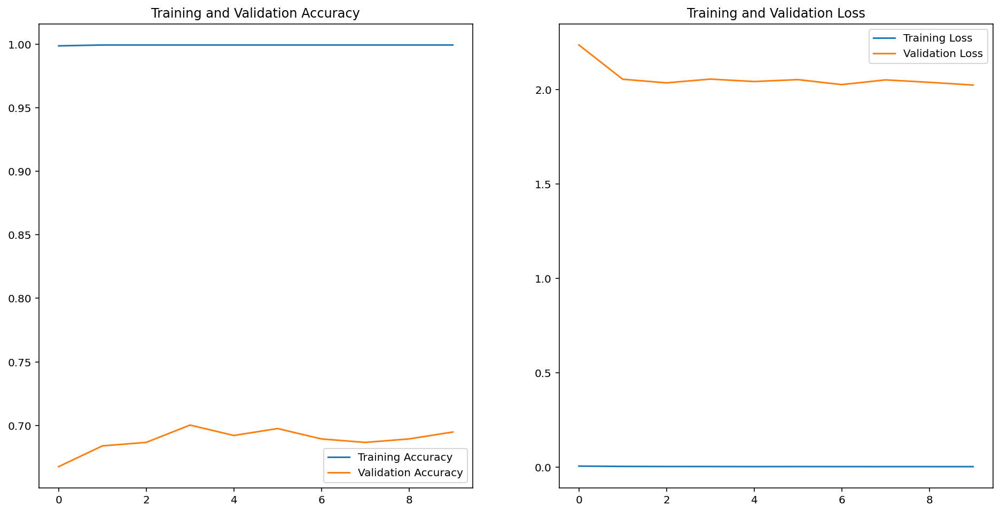

In [37]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [38]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[1.37428113e-09, 2.59140087e-09, 4.19926742e-04, 1.08787674e-04,
        9.99471247e-01],
       [1.00000000e+00, 1.32219693e-08, 8.25298829e-10, 1.04260396e-15,
        3.18006316e-10],
       [3.54114562e-01, 1.88804427e-06, 1.61095783e-01, 4.84370470e-01,
        4.17264207e-04],
       [7.11663815e-05, 6.61952375e-03, 9.56582308e-01, 4.74327999e-09,
        3.67269963e-02],
       [9.96188104e-01, 7.52641936e-04, 1.12379485e-05, 8.64921333e-07,
        3.04717268e-03],
       [6.49605870e-01, 2.60829419e-01, 2.54264637e-03, 2.57295756e-06,
        8.70195106e-02],
       [7.31532168e-10, 4.44049388e-03, 9.95559216e-01, 2.55183267e-07,
        1.65024847e-08],
       [3.62352952e-02, 5.01531933e-04, 8.12951922e-01, 2.99882515e-07,
        1.50310948e-01],
       [6.45893721e-08, 1.82062193e-15, 1.70184205e-08, 9.99999881e-01,
        1.21383159e-09],
       [1.00000000e+00, 3.74596326e-11, 6.80776982e-14, 2.32104524e-16,
        5.90677377e-12],
       [1.00000000e+00, 1.9449

In [39]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 0, 3, 2, 0, 0, 2, 2, 3, 0, 0, 0, 3, 4, 0, 3, 2, 0, 0, 2, 2, 0,
       2, 0, 0, 2, 4, 2, 2, 3, 0, 0])

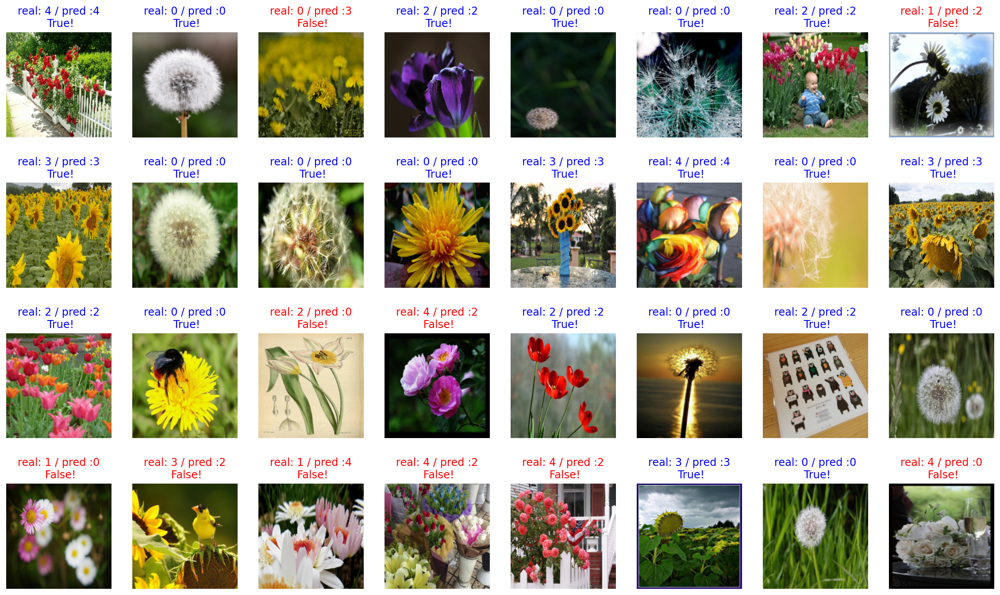

In [40]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [41]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    # [[YOUR CODE]]
    if label == prediction:
      count +=1     


print(count / 32 * 100)    # 약 70% 내외

68.75


In [42]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [43]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [44]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [45]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [46]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [49]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
#prediction_layer = tf.keras.layers.Dense(2, activation='softmax')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [50]:
base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_7 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [52]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])


In [54]:

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/12 [==============================] - 8s 635ms/step - loss: 1.8516 - accuracy: 0.1635
initial loss: 1.85
initial accuracy: 0.16


In [55]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
92/92 [==============================] - 81s 883ms/step - loss: 1.3796 - accuracy: 0.5208 - val_loss: 1.1511 - val_accuracy: 0.6866
Epoch 2/5
92/92 [==============================] - 83s 900ms/step - loss: 1.0456 - accuracy: 0.6999 - val_loss: 0.9400 - val_accuracy: 0.7112
Epoch 3/5
92/92 [==============================] - 83s 898ms/step - loss: 0.8685 - accuracy: 0.7398 - val_loss: 0.7937 - val_accuracy: 0.7193
Epoch 4/5
92/92 [==============================] - 82s 896ms/step - loss: 0.7629 - accuracy: 0.7585 - val_loss: 0.7146 - val_accuracy: 0.7439
Epoch 5/5
92/92 [==============================] - 82s 888ms/step - loss: 0.6942 - accuracy: 0.7776 - val_loss: 0.6686 - val_accuracy: 0.7684


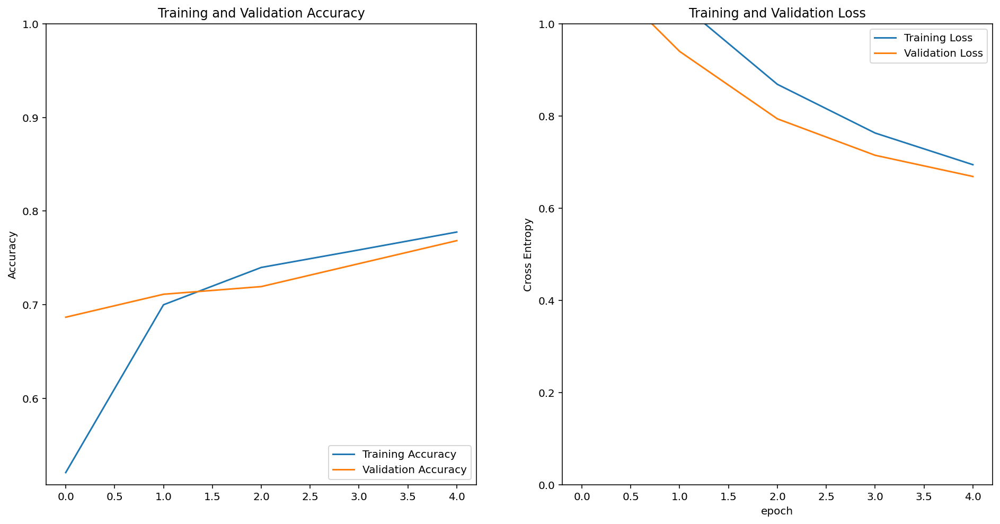

In [56]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [57]:
#delete 
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[5.94777204e-02, 1.16534531e-01, 6.03398204e-01, 1.10257201e-01,
        1.10332355e-01],
       [9.87935305e-01, 6.83179637e-03, 6.38582336e-04, 2.45054998e-03,
        2.14382797e-03],
       [6.55291140e-01, 1.37985632e-01, 5.37183918e-02, 1.17474549e-01,
        3.55302207e-02],
       [1.63858607e-02, 7.92175308e-02, 4.68090981e-01, 4.06791344e-02,
        3.95626545e-01],
       [5.60693383e-01, 3.07651162e-01, 4.80498970e-02, 3.51233445e-02,
        4.84821945e-02],
       [8.09629381e-01, 8.94656256e-02, 3.10951471e-02, 5.69430701e-02,
        1.28668677e-02],
       [3.21501493e-02, 3.77730168e-02, 5.43359458e-01, 2.66800880e-01,
        1.19916491e-01],
       [3.12736392e-01, 3.16868752e-01, 1.38308257e-02, 3.17729712e-01,
        3.88343520e-02],
       [4.10930663e-02, 2.01596450e-02, 6.76137805e-02, 7.31328607e-01,
        1.39804944e-01],
       [9.95992124e-01, 2.44944263e-03, 1.07226530e-04, 1.22522609e-03,
        2.26022181e-04],
       [9.21360314e-01, 4.3508

In [58]:

import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 3, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 2, 4, 2, 3, 0, 4])

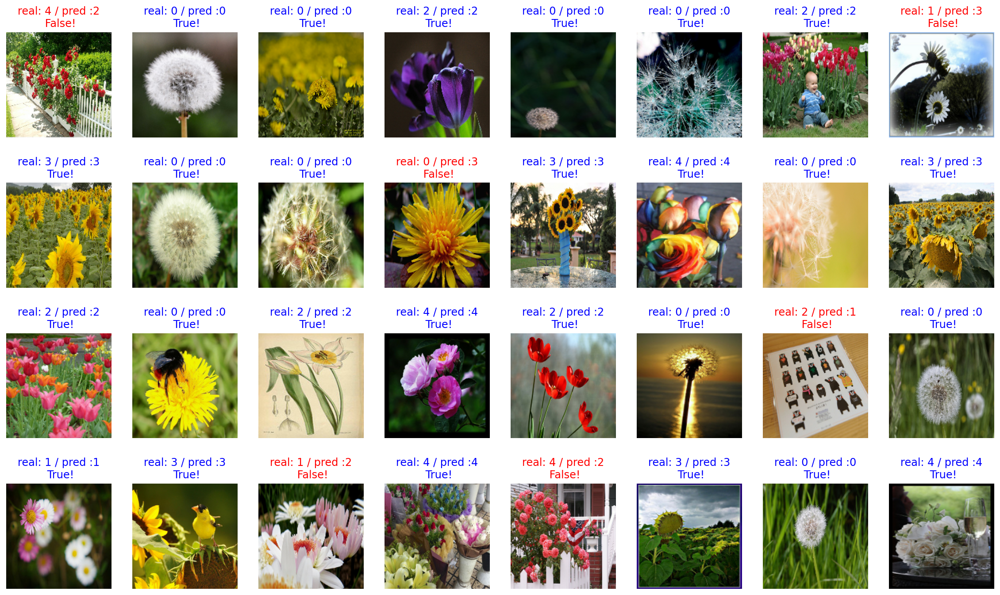

In [59]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [60]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

81.25


In [62]:
#ephoch increase to 12
EPOCHS = 12   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/12
92/92 [==============================] - 83s 903ms/step - loss: 0.6269 - accuracy: 0.7956 - val_loss: 0.6195 - val_accuracy: 0.7847
Epoch 2/12
92/92 [==============================] - 85s 925ms/step - loss: 0.5920 - accuracy: 0.8089 - val_loss: 0.5977 - val_accuracy: 0.7875
Epoch 3/12
92/92 [==============================] - 84s 916ms/step - loss: 0.5646 - accuracy: 0.8185 - val_loss: 0.5780 - val_accuracy: 0.7875
Epoch 4/12
92/92 [==============================] - 84s 916ms/step - loss: 0.5412 - accuracy: 0.8287 - val_loss: 0.5571 - val_accuracy: 0.8038
Epoch 5/12
92/92 [==============================] - 85s 924ms/step - loss: 0.5238 - accuracy: 0.8317 - val_loss: 0.5502 - val_accuracy: 0.8093
Epoch 6/12
92/92 [==============================] - 85s 925ms/step - loss: 0.5051 - accuracy: 0.8372 - val_loss: 0.5387 - val_accuracy: 0.8202
Epoch 7/12
92/92 [==============================] - 84s 915ms/step - loss: 0.4915 - accuracy: 0.8440 - val_loss: 0.5293 - val_accuracy: 0.8202

In [63]:
# learning rate to change
base_learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)


12/12 [==============================] - 7s 618ms/step - loss: 0.5013 - accuracy: 0.8283
initial loss: 0.50
initial accuracy: 0.83
Epoch 1/5
92/92 [==============================] - 83s 904ms/step - loss: 0.5181 - accuracy: 0.8144 - val_loss: 0.6550 - val_accuracy: 0.7548
Epoch 2/5
92/92 [==============================] - 83s 904ms/step - loss: 0.4487 - accuracy: 0.8372 - val_loss: 0.4933 - val_accuracy: 0.8229
Epoch 3/5
92/92 [==============================] - 83s 905ms/step - loss: 0.4078 - accuracy: 0.8535 - val_loss: 0.5027 - val_accuracy: 0.8093
Epoch 4/5
92/92 [==============================] - 83s 904ms/step - loss: 0.3793 - accuracy: 0.8604 - val_loss: 0.4539 - val_accuracy: 0.8420
Epoch 5/5
92/92 [==============================] - 83s 906ms/step - loss: 0.3532 - accuracy: 0.8706 - val_loss: 0.4910 - val_accuracy: 0.8202


In [64]:
# optimizer change to adam?
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

12/12 [==============================] - 8s 664ms/step - loss: 0.4910 - accuracy: 0.8202
initial loss: 0.49
initial accuracy: 0.82
Epoch 1/5
92/92 [==============================] - 82s 896ms/step - loss: 0.2656 - accuracy: 0.9114 - val_loss: 0.4308 - val_accuracy: 0.8529
Epoch 2/5
92/92 [==============================] - 83s 901ms/step - loss: 0.2496 - accuracy: 0.9179 - val_loss: 0.4226 - val_accuracy: 0.8610
Epoch 3/5
92/92 [==============================] - 83s 900ms/step - loss: 0.2438 - accuracy: 0.9220 - val_loss: 0.4366 - val_accuracy: 0.8501
Epoch 4/5
92/92 [==============================] - 83s 900ms/step - loss: 0.2416 - accuracy: 0.9230 - val_loss: 0.4271 - val_accuracy: 0.8501
Epoch 5/5
92/92 [==============================] - 84s 909ms/step - loss: 0.2352 - accuracy: 0.9223 - val_loss: 0.4232 - val_accuracy: 0.8556


In [65]:
#change to vgg19
# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG19(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

feature_batch = base_model(image_batch)
feature_batch_average = global_average_layer(feature_batch)

dense_layer = tf.keras.layers.Dense(512, activation='relu')
#prediction_layer = tf.keras.layers.Dense(2, activation='softmax')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))

base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

base_learning_rate = 0.0001
# add regularization to loss function
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)


12/12 [==============================] - 10s 803ms/step - loss: 1.6429 - accuracy: 0.2752
initial loss: 1.64
initial accuracy: 0.28
Epoch 1/5
92/92 [==============================] - 103s 1s/step - loss: 1.3676 - accuracy: 0.5201 - val_loss: 1.1633 - val_accuracy: 0.6730
Epoch 2/5
92/92 [==============================] - 104s 1s/step - loss: 1.0559 - accuracy: 0.6829 - val_loss: 0.9338 - val_accuracy: 0.7330
Epoch 3/5
92/92 [==============================] - 146s 2s/step - loss: 0.8896 - accuracy: 0.7248 - val_loss: 0.8358 - val_accuracy: 0.7793
Epoch 4/5
 1/92 [..............................] - ETA: 0s - loss: 0.7773 - accuracy: 0.7188

KeyboardInterrupt: 

In [ ]:
# regularization???
# add regularization to loss function
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)


In [ ]:
# Step5. 성능 평가?
# 모델 학습과정 그래프 그리기,
# validation_batches / test_batches 예즉결과 확인


In [ ]:
# 모델 활용하기 - 임의의 이미지 넣어 보기....